# Исследование рынка заведений общественного питания Москвы



**Заказчик:** Инвесторы из фонда «Shut Up and Take My Money»\
**Задачи:**
1. Подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты,\
которые в будущем помогут в выборе подходящего инвесторам места.
2. Дать рекомендации по открытию кофейни.

**Контекст:**

Заказчики решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Они ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.
Для начала они хотят изучить рынок Москвы и выбрать подходящее место.

Также инвесторам «Shut Up and Take My Money» не даёт покоя успех сериала «Друзья». Их мечта — открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве. Заказчики не боятся конкуренции в этой сфере, несмотря на то, что кофеен в больших городах уже достаточно.

**Данные:** файл `moscow_places.csv` содержит датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года.

`name` — название заведения;\
`address` — адрес заведения;ъ
`category` — категория заведения, например «кафе», «пиццерия» или «кофейня»;\
`hours` — информация о днях и часах работы;\
`lat` — широта географической точки, в которой находится заведение;\
`lng` — долгота географической точки, в которой находится заведение;\
`rating` — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);\
`price` — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;\
`avg_bill` — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
* «Средний счёт: 1000–1500 ₽»;
* «Цена чашки капучино: 130–220 ₽»;
* «Цена бокала пива: 400–600 ₽» и так далее;\

`middle_avg_bill` — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
* Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
* Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
* Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.

`middle_coffee_cup` — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
* Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
* Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
* Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.

`chain` — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
* 0 — заведение не является сетевым
* 1 — заведение является сетевым

`district` — административный район, в котором находится заведение, например Центральный административный округ;\
`seats` — количество посадочных мест.

**План исследования**:
1. Исследование и предобработка данных
2. Анализ данных
3. Рекомендации по открытию кофейни в Москве
4. Выводы

## Изучение и предобработка данных

In [1]:
# импортируем необходимые библиотеки
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import json
import folium
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster
import warnings

In [2]:
# загружаем данные
try:
    places = pd.read_csv('moscow_places.csv')
except:
    places = pd.read_csv('/datasets/moscow_places.csv')

### Общие параметры

In [3]:
# выведем информацию о датасете
places.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [4]:
# смотрим датафрейм
places.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


* Формат наименований столбцов **корректен**.\
Типы данных в целом также **корректны**, однако для некоторых столюцов можем поменять тип для экономии памяти.

In [5]:
# для экономии памяти изменим типы данных
places = places.astype({'rating': 'float32', 'chain': 'int32', 'seats': 'float32'})

* Оценим количество представленных заведений

In [6]:
print('В датасете собрана информация о {} заведений общественного питания, представляющих {} уникальных брендов'\
      .format(places.shape[0], places['name'].nunique()))

В датасете собрана информация о 8406 заведений общественного питания, представляющих 5614 уникальных брендов


* Проверим столбцы с **числовыми** значениями на наличие **аномалий**.

In [7]:
# посмотрим статистику по значениям в столбце с рейтингом заведений
places.rating.describe()

count    8406.000000
mean        4.229911
std         0.470342
min         1.000000
25%         4.100000
50%         4.300000
75%         4.400000
max         5.000000
Name: rating, dtype: float64

* Судя по статистическим показателям, явных аномалий в столбце `rating` нет.

In [8]:
# посмотрим статистику по значениям в столбце с оценкой среднего чека
places.middle_avg_bill.describe()

count     3149.000000
mean       958.053668
std       1009.732845
min          0.000000
25%        375.000000
50%        750.000000
75%       1250.000000
max      35000.000000
Name: middle_avg_bill, dtype: float64

* __Среднее__ и __медианное__ значения, а также **75-ый перцентиль** выглядят реалистичными.\
__Минимальное__ и **максимальное** значения говорят о том, что в столбце есть ошибки.

In [9]:
# посмотрим статистику по значениям в столбце с оценкой одной чашки капучино
places.middle_coffee_cup.describe()

count     535.000000
mean      174.721495
std        88.951103
min        60.000000
25%       124.500000
50%       169.000000
75%       225.000000
max      1568.000000
Name: middle_coffee_cup, dtype: float64

* Очевидных аномалий в данном столбце не видим

In [10]:
# проверим значения в столбце 'chain'
places.chain.value_counts()

0    5201
1    3205
Name: chain, dtype: int64

* В данном столбце должны встречаться только значение **1** и **0**, в чем мы и убедились.

In [11]:
# посмотрим статистику по значениям в столбце с кол-вом посадочных мест
places.seats.describe()

count    4795.000000
mean      108.421692
std       122.833374
min         0.000000
25%        40.000000
50%        75.000000
75%       140.000000
max      1288.000000
Name: seats, dtype: float64

* __Среднее__ значение явно искажено выбросами, **мин** значение - **0**, что может указывать на наличие ошибки.

### Пропуски

In [12]:
# посчитаем пропуски
missing_values_count = places.isna().sum()

# посчитаем долю пропусков от общего кол-ва значений
missing_values_share = places.isna().mean()

# создадим таблицу с количеством и долей пропусков
missing_values_table = pd.concat([missing_values_count, missing_values_share], axis=1)
missing_values_table.columns = ['missing_cnt', 'missing_share']

# приведем значение в столбце с долями к удобному формату
missing_values_table['missing_share'] = missing_values_table['missing_share'].map("{:.2%}".format)

missing_values_table

,missing_cnt,missing_share
name,0,0.00%
category,0,0.00%
address,0,0.00%
district,0,0.00%
hours,536,6.38%
lat,0,0.00%
lng,0,0.00%
rating,0,0.00%
price,5091,60.56%
avg_bill,4590,54.60%


* В столбцох `hours`, `price`, `avg_bill`, `middle_avg_bill`, `middle_coffee_cup` и `seats` обнаружены **пропуски**,\
однако замена пропусков в данных столбцах на расчетные значения приведет к **искажениям**, поэтому пропуски в датасете мы оставим.

### Дубликаты

In [13]:
# проверим датасет на наличие дубликатов
places.duplicated().sum()

0

* Дубликаты не обнаружены.

* В столбцах `category` и `name`могут быть неявные дубликаты. Посмотрим значения, которые встречаются в этих столбцах.

In [14]:
# смотрим значения в столбце 'category'
places['category'].value_counts()

кафе               2378
ресторан           2043
кофейня            1413
бар,паб             765
пиццерия            633
быстрое питание     603
столовая            315
булочная            256
Name: category, dtype: int64

* В списке мы видим только уникальные категории. Значений, которые называли бы **одну и ту же** категорию по-разному, **нет**.

* Посмотрим перечень уникальных наименований заведений.

In [15]:
# положим отсортированные значения в переменную
name_list = places.name.sort_values()

# для удобства просмотра выведем значения в столбик
for name in name_list.unique():
    print(name)

#КешбэкКафе
+39 Pizzeria Mozzarella bar
1 Этаж
1-я Креветочная
10 Идеальных Пицц
1001 Ночь
100ловая
100лоффка
13
13 Chef doner
15 Kitchen+Bar
15-й Шар
16 Июня
16 Тонн
18 Грамм
1901 Comfort Food Zone
1у
2 Типа
2-й Этаж
2046
21 Век
22 Акра Кофе&Хлеб
2U-Ту-Ю
3 Ступени
351 Bar
4 Сезона
4.2. Bar
4/1 Restaurant
42 Coffee Shop
47
495
4friends Coffee
4tuna Cafe&Grill
5 Stars Coffee
55.709201, 37.392257
6 Am Bread Kitchen
6 Рукопожатий
69 раков
7 Сэндвичей
7 элемент
7/12
8 Oz
8 Вафель
8 Зёрен
8 Пончиков
800°с Contemporary Steak
8bit Pizza
9 Bar Coffe
9 Bar Coffee
9 Зёрен
A-cafe
ABC Coffee Roasters
ABC coffee roasters
Acai Family
Accent
Adam's Chicken
Adria Mare
Ahava
Air Coffee
Al Halal
Al33 Пиццерия бар Боттега
All Day
Alma
Alternative coffee
Aly’s Poke
Amande
Amarena
Americano Black Coffee & Food
Amg cafe
Ami Chaise
Amore Grande
Amsterdam Bar
Andy Coffee
Angel Cakes City
Angel Cakes Patriki
Ann Joy
Anri Bakery
Antalya
Anvil Cafe
Aq Kitchen
Aquarium
Arabix
Arch 1908
Archie
Arcus Bar And Food
A

Вrazil Steakhouse
ВДНХ
ВО сколько начинается аперитив?
ВО! Вкусный обед
Вав
Вагонъ
Вадваре
Важная Персона
Важная персона
Вазян
Вай Мэ!
Вайбс
Вайн Рум Галерея Гурме
Вайт Холл
Ван Холл
Вангог центр
Ваниль
Ванильное небо
Ванильный Шпатель
Ваня
Ваня и Гоги
Варежка кафе
Вареничная № 1
Вареничная №2
Варим тепло
Варня кафе
Варшавский
Васильки
Вафли, крепы, два яйца
Вах Гоги
Вах! Хинкали!
Вахтанг
Ваш лаваш
Вегетарианский фудкорт Брокколи
Везувий
Везувио
Вектор
Вельвет
Венахи
Венд кафе БЦ Электродный
Венская сказка
Венское
Веранда
Веранда 32.05
Верба
Верд
Верди
Вереница
Верона
Верстак
Вертел
Вертел Шаурма
Вершина 3003
Вершина. Еда
Веселая черепашка
Вескор
Весна
Ветераны фалафеля
Ветерок
Ветка
Вечера на хуторе
Виват Пицца
Викрама
Виктория
Виктория и Альберт
Виладж пицца
Вилла Тифлис
Винил и Вино
Винный базар
Винный бар Шали Вали
Винный ресторан La Carta
Винный рынок
Вино
Вино в Большом Городе
Вино и Еда by Первый Нос
Вино и Море
Виновано
Винотека Pion&Pudra
Винотека, булочная, кулинария Вино & к

* В столбце обнаружено **множество** неявных дубликатов, которые очевидно возникли вследствие **ручного ввода** наименований,\
поэтому чтобы избавиться от них на 100% потребуются существенные временные затраты.\
Однако мы можем выделить основные **типы** расхождений в написании и применить к каждому из них **определенный метод**\
для **массовой корректировки** значений. Таким образом мы сможем **быстро** устранить **подавляющее большинство** дубликатов,\
а доля оставшихся будет **настолько мала**, что этим можно будет **пренебречь**.

* Итак, обнаруженные неявные дубликаты можно отнести к следующим типам:
    1. Использование **строчной** буквы вместо **заглавной** или наоборот.\
    __Напр.:__ "Bb Grill" и "Bb grill"; "HelloPapaya" и "Hellopapaya".\
    Такие дубликаты встречаются **чаще всего**, поэтому применив метод перевода значения в **нижний регистр**\
    мы сразу устраним **бОльшую** часть дубликатов.
    2. Наличие/ отсутствие небуквенных знаков.\
    __Напр.:__ "Алло Пицца" и "Алло! Пицца"; "Аль Бухари" и "Аль-Бухари"; "Яндекс Лавка" и "Яндекс.Лавка".\
    От таких дубликатов мы можем избавиться методом **замены** следующих знаков **на пробел**:\
        "!" восклицательный знак\
        "," запятая\
        "." точка\
        "-" дефис
    3. Наличие/ отсутствие пробелов вокруг знака "&".\
    __Напр.:__ "Corner cafe & kitchen" и "Corner cafe&kitchen"; "Есть Хинкали & Пить Вино" и "Есть Хинкали&Пить Вино".\
    Устранить подобные дубликаты возможно только **вручную**, что мы и сделаем с двумя обнаруженными нами во время беглого просмотра примерами.
    4. Уникальные.\
    __Напр.:__ "9 bar coffee" и "9 bar coffe" - ошибка в написании;\
    "Drive Cafe" и "Drive Café" - использование буквы "é";\
    "Домино'с Пицца", "Доминос пицца" и "Домино'с" - упрощенные варианты написания.\
    Эти случаи мы также исправим **вручную**.

In [16]:
# приведём значения к нижнему регистру
places['name'] = places['name'].str.lower()

In [17]:
# проверим
places['name'].nunique()

5512

In [18]:
print('Уникальных наименований стало на {} меньше.'.format(name_list.nunique() - places['name'].nunique()))

Уникальных наименований стало на 102 меньше.


In [19]:
# удалим знаки либо заменим их на пробел
warnings.filterwarnings("ignore")

places['name'] = places['name'].str.replace('!', '')\
                .str.replace(',', '').str.replace('.', '')\
                .str.replace('-', ' ')

In [20]:
# проверяем
print('Уникальных наименований стало на {} меньше.'.format(name_list.nunique() - places['name'].nunique()))

Уникальных наименований стало на 127 меньше.


In [21]:
# теперь устраним обнаруженные единичные случаи неявных дубликатов
places['name'].replace({'corner cafe&kitchen': 'corner cafe & kitchen',
                       'есть хинкали&пить вино': 'есть хинкали & пить вино', 
                       '9 bar coffe': '9 bar coffee', 
                       'drive café': 'drive cafe', 
                       'доминос пицца': "домино'с пицца", 
                       "домино'с": "домино'с пицца"}, inplace=True)

In [22]:
# проверяем
print('Уникальных наименований стало на {} меньше.'.format(name_list.nunique() - places['name'].nunique()))

Уникальных наименований стало на 133 меньше.


* Существенная доля неявных дубликатов устранена.

### Аномальные значения

* Вернемся к аномалиям в столбцах `middle_avg_bill` и `seats`, которые мы обнаружили ранее.

In [23]:
# напишем функцию для визуализации распределения по определенному столбцу
def val_distribution (column, lim=200):

    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(16, 4))
    fig.suptitle('Распределение значений {}'.format(column), fontsize=14, y=1.05)

    ax1.hist(places[column], bins=100)
    ax1.set_xlabel('значения')
    ax1.set_ylabel('частота')
    ax1.set_title('Гистограмма распределения')

    ax2.scatter(range(len(places)), places[column])
    ax2.set_xlabel('индекс')
    ax2.set_ylabel('значения')
    ax2.set_title('Точечная (верхние выбросы)')

    ax3.scatter(range(len(places)), places[column])
    ax3.set_xlabel('индекс')
    ax3.set_ylabel('значения')
    ax3.set_title('Точечная (нижние выбросы)')
    ax3.set_ylim(0, lim)

    plt.show()

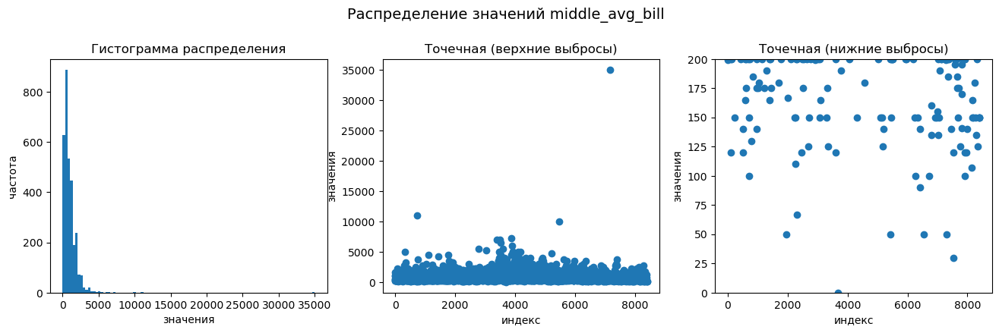

In [24]:
# смотрим распределение значений в столбце с оценкой среднего чека
val_distribution('middle_avg_bill')

* Судя по графикам, значения **выше 5000** и **ниже 100** можно считать выбросами.

* Посмотрим срез по значениям выше 5000.

In [25]:
places.query('middle_avg_bill > 5000')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
730,чойхона,"бар,паб","Москва, Дмитровское шоссе, 95А",Северный административный округ,"ежедневно, 10:00–23:00",55.871497,37.543555,4.4,высокие,Средний счёт:5000–17000 ₽,11000.0,NaN,0,49.0
2795,крошка картошка,быстрое питание,"Москва, Щёлковское шоссе, вл75",Восточный административный округ,"ежедневно, 10:00–22:00",55.811160,37.799823,4.0,высокие,Средний счёт:1000–10000 ₽,5500.0,NaN,1,NaN
3038,беллини,ресторан,"Москва, Рублёвское шоссе, 28",Западный административный округ,"ежедневно, 12:00–00:00",55.747632,37.425631,4.3,высокие,Средний счёт:5000–5500 ₽,5250.0,NaN,0,150.0
3396,марио,ресторан,"Москва, улица Климашкина, 17",Центральный административный округ,"ежедневно, 12:00–00:00",55.767792,37.568453,4.5,высокие,Средний счёт:7000 ₽,7000.0,NaN,0,100.0
3487,800°с contemporary steak,ресторан,"Москва, Большой Патриарший переулок, 6, стр. 1",Центральный административный округ,"ежедневно, 09:00–23:30",55.762708,37.592138,4.7,высокие,Средний счёт:6000–8000 ₽,7000.0,NaN,0,75.0
3518,чайка,ресторан,"Москва, Краснопресненская набережная, 12А",Центральный административный округ,"ежедневно, 12:00–00:00",55.752857,37.556365,4.8,высокие,Средний счёт:5000–8000 ₽,6500.0,NaN,1,250.0
3603,lucky izakaya bar,"бар,паб","Москва, Калашный переулок, 9",Центральный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–02:00; вс 12:00...",55.757313,37.599581,4.8,высокие,Средний счёт:5500 ₽,5500.0,NaN,0,NaN
3882,white rabbit,ресторан,"Москва, Смоленская площадь, 3",Центральный административный округ,"ежедневно, 12:00–00:00",55.747608,37.581248,4.9,высокие,Средний счёт:7000–7500 ₽,7250.0,NaN,0,150.0
3910,кантинетта антинори,ресторан,"Москва, Денежный переулок, 20",Центральный административный округ,"ежедневно, 12:00–00:00",55.745383,37.586595,4.7,высокие,Средний счёт:6000 ₽,6000.0,NaN,0,80.0
5481,гости,ресторан,"Москва, шоссе Энтузиастов, 52",Восточный административный округ,"пн,вс 18:00–22:30",55.759088,37.760570,4.1,высокие,Средний счёт:5000–15000 ₽,10000.0,NaN,0,NaN


* Исходя из данной таблицы можно сделать вывод, что значения **>= 10000** появились в датасете вследствие ошибки.\
При этом видим ряд заведений в **Центральном** административном округе и на **Рублевском** шоссе со средним чеком **от 5000 до 7250**. Принимая во внимание их расположение, допускаем, что значения среднего чека актуальны. Чего нельзя сказать о **"Крошке Картошке"**, для которой средний счет **5500 руб** выглядит **нереалистично**.\
С учетом изложенных выше наблюдений мы удалим из датасета строки со значениями **>=10000** и **<100**, а также строку с **"Крошкой Картошкой"**.

In [26]:
# перезапишем переменную, сделав срез
places = places.query('(middle_avg_bill < 10000 and middle_avg_bill >= 100) or middle_avg_bill != middle_avg_bill')
# исключаем из датасета строку с 'Крошкой картошкой'
places = places.drop(2795)

* Теперь посмотрим распределение значений в столбце `seats`.

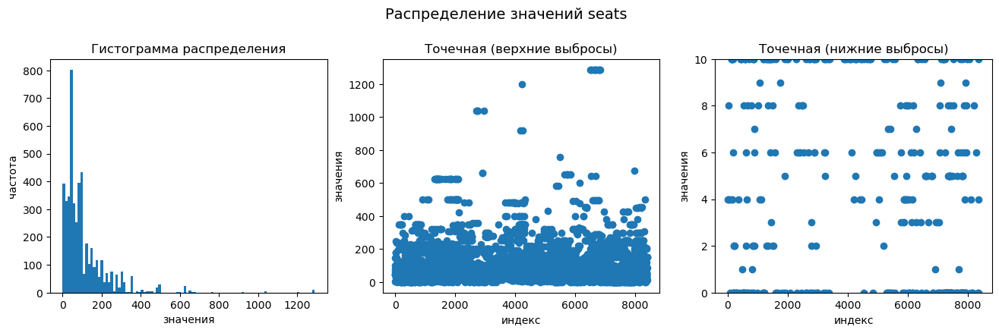

In [27]:
val_distribution('seats', lim=10)

* Исходя из графиков значения **выше 600** можем считать выбросами и удалить соответствующие строки.\
Также видим некоторое количество **нулевых** значений, которые могли возникнуть в датасете вследствие ошибки.\
При этом понимаем, что для **некоторых категорий** заведений нулевое значение может быть вполне уместным.\
Значит прежде, чем принимать решение по таким строкам, посмотрим, как они распределеются по категориям.

In [28]:
# исключаем строки с кол-вом мест более 600
places = places.query('seats <= 600 or seats != seats')

In [29]:
# смотрим, у каких категорий заведений встречается значение 0 в столбце 'seats'
places.query('seats == 0').category.value_counts()

кафе               44
кофейня            24
ресторан           20
быстрое питание    18
булочная           11
пиццерия           10
столовая            5
бар,паб             4
Name: category, dtype: int64

* Допускаем, что заведение **быстрого питания**, **булочная** или **пиццерия** может не иметь посадочных мест.\
Однако этого нельзя сказать о **кафе**, **ресторане**, **баре** и остальных категориях. Поэтому строки с нулевым количеством посадочных мест для всех категорий кроме **3-ех** упомянутых в начале будем считать **аномалиями** и удалим из датасета.

In [30]:
# перезапишем переменную, сделав срез
places = places.query('seats != 0 or category == "быстрое питание" or category == "булочная" or\
                        category == "пиццерия"')

In [31]:
# проверим
places.query('seats == 0').category.value_counts()

быстрое питание    18
булочная           11
пиццерия           10
Name: category, dtype: int64

In [32]:
# сбрасываем индексы
places.reset_index(drop=True, inplace=True)

### Дополнительные столбцы

* Для удобства проведения дальнейшего исследования создадим новый столбец с наименованием улицы, на которой располагается заведение.

In [33]:
# посмотрим датасет
places.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [34]:
# из адреса выделим улицу, указав в качестве разделителя запятую + пробел
places['street'] = places['address'].str.split(', ').str[1]

* Теперь создадим столбец, содержащий **логические** значения, которые будут указывать, работает ли заведение **круглосуточно** или нет.

In [35]:
# определять круглосуточную работу будем по содержанию "-круг-" в значениях столбца 'hours'
places['is_24/7'] = places['hours'].str.contains('.*круг.*') & places['hours'].str.contains('.*ежед.*')

In [36]:
# проверяем
places.head(20)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False
1,четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
4,иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False
5,sergio pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,0,NaN,Ижорская улица,False
6,огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,0,45.0,Клязьминская улица,False
7,mr уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,0,45.0,Клязьминская улица,False
8,donna maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0,Дмитровское шоссе,False
9,готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,0,65.0,Ангарская улица,False


* Датасет готов к дальнейшему анализу.

## Анализ данных

### Кол-во объектов по категориям.

In [37]:
# создаем переменную с группировкой данных по категориям
category_cnt = places.groupby('category', as_index=False).agg({'name': 'count'}).sort_values(by='name', ascending=False)
category_cnt

,category,name
3,кафе,2321
6,ресторан,2009
4,кофейня,1373
0,"бар,паб",751
5,пиццерия,629
2,быстрое питание,599
7,столовая,308
1,булочная,254


In [38]:
# напишем функцию для вывода гистограммы с разбивкой по категориям
def category_hist(xvalue, yvalue, data, ylabel, xlabel, title):
    plt.figure(figsize=(13, 8))
    sns.set(font_scale=1.2, font='Arial, sans-serif', style='whitegrid')
    ax = sns.barplot(x=xvalue, y=yvalue, data=data, palette='Set2')
    for p in ax.patches:
        ax.annotate(format(p.get_height(), '.1f'), (p.get_x() + p.get_width() / 2., p.get_height()),
                    ha = 'center', va = 'center', xytext = (0, 10), textcoords = 'offset points')
    plt.ylabel(ylabel)
    plt.xlabel(xlabel)
    plt.title(title)
    plt.show()

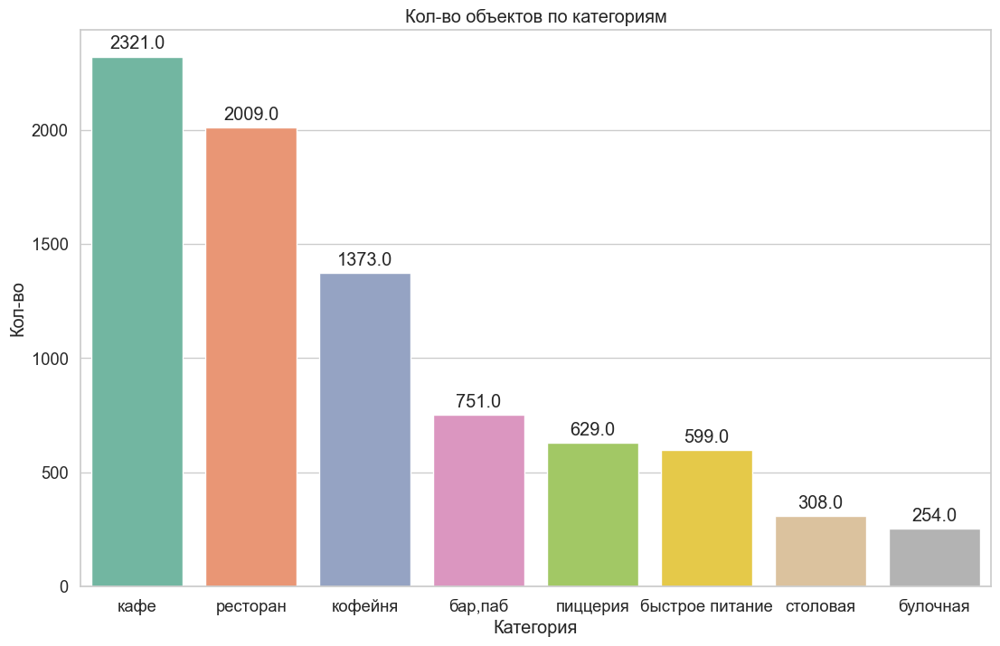

In [39]:
# строим гистограмму распределения объектов по категориям
category_hist('category', 'name', category_cnt, 'Кол-во', 'Категория', 'Кол-во объектов по категориям')

**Вывод:**\
Наиболее распространенными категориями заведений являются **кафе** и **рестораны**. Наименее распространенными - **столовые** и **булочные**. Отметим также **кофейни**, которые несмотря на отставание от кафе и ресторанов все-таки **заметно опережают** все остальные категории.

### Кол-во посадочных мест по категориям

In [40]:
# напишем функцию для визуализации статистики по определенному признаку в разрезе категорий
def display_boxplot(data, xvalue, yvalue, xlabel, ylabel, title):
    fig = px.box(data, x=xvalue, y=yvalue)
    fig.update_layout(title=title,
                       xaxis_title=xlabel,
                       yaxis_title=ylabel)

    color_palette = px.colors.qualitative.Set2

    fig.update_traces(marker_color=color_palette[2])

    fig.show()

In [41]:
# визуализируем статистику распределения посадочных мест
display_boxplot(places, 'category', 'seats', 'Категория', 'Кол-во мест', 'Кол-во посадочных мест по категориям')

* Видим, что для данного признака характерны значительные **выбросы**,\
поэтому гистограмму распределения будем строить по **медианным** значениям.

In [42]:
# создаем переменную с медианным кол-вом мест для каждой категории
category_seats = places.groupby('category', as_index=False).agg({'seats': 'median'})\
                                .sort_values(by='seats', ascending=False)
category_seats

,category,seats
6,ресторан,87.0
0,"бар,паб",81.0
4,кофейня,80.0
7,столовая,76.0
2,быстрое питание,67.0
3,кафе,60.0
5,пиццерия,52.0
1,булочная,50.0


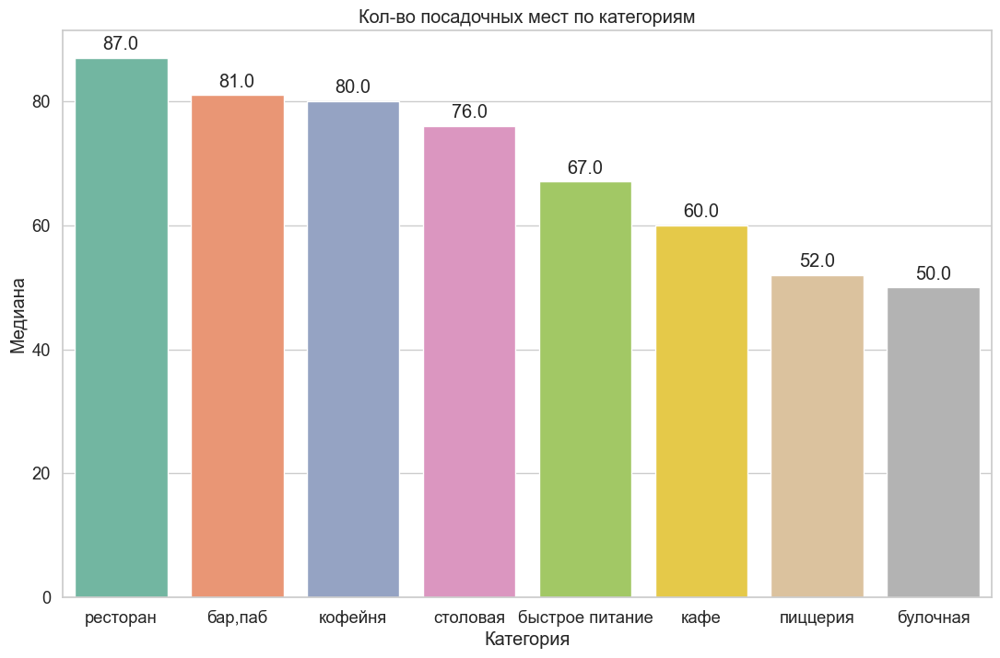

In [43]:
# строим гистограмму распределения медианного кол-ва мест по категориям
category_hist('category', 'seats', category_seats, 'Медиана', 'Категория', 
              'Кол-во посадочных мест по категориям')

**Вывод:**\
Наибольшее кол-во посадочных мест встречается в **ресторанах** и **барах**. **Кофейни** и **столовые** отличаются от лидеров незначительно.
**Наименьшее** кол-во мест характерно для **пиццерий** и **булочных**.

### Доля сетевых заведений

In [44]:
# создаем переменную с кол-вом сетевых и несетевых заведений
chain_cnt = places['chain'].value_counts()

# создаем переменную для наименований в легенде
chain_labels = ['Сетевые', 'Несетевые']

# создаем переменную со значениями
chain_values = [chain_cnt[1], chain_cnt[0]]

In [45]:
# напишем функцию для построения круговой диаграммы
def display_pieplot(labels, values, title):
    color_palette = px.colors.qualitative.Set2

    fig = go.Figure(data=[go.Pie(labels=labels, values=values, 
                                 marker=dict(colors=[color_palette[0], color_palette[2]]))])
    fig.update_layout(title=title)

    fig.show()

In [46]:
# визуализируем доли сетевых и несетевых заведений
display_pieplot(chain_labels, chain_values, 'Соотношение сетевых и несетевых заведений')

**Вывод:**\
__Несетевых__ заведений **в 1,5 раза** больше, чем сетевых.

### Категории сетевых заведений

* Визуализируем соотношение кол-ва сетевых и несетевых заведений в разрезе по категориям.

In [47]:
# создаем переменные с кол-вом сетевых и несетевых заведений по категориям
chain_category_cnt = places[places['chain'] == 1]['category'].value_counts().sort_index()
non_chain_category_cnt = places[places['chain'] == 0]['category'].value_counts().sort_index()

# создаем список категорий, отсортированный по убыванию кол-ва сетевых заведений
sorted_categories = chain_category_cnt.sort_values(ascending=False).index

# меняем порядок категорий в соответствии со списком
chain_category_cnt = chain_category_cnt.reindex(sorted_categories)
non_chain_category_cnt = non_chain_category_cnt.reindex(sorted_categories)

In [48]:
# напишем функцию для визуализации соотношения значений сетевых и несетевых заведений по категориям
def display_chain_categories(chain_yvalues, non_chain_yvalues, xlabel, ylabel, title):
    # выбираем цветовую схему
    color_palette = px.colors.qualitative.Set2

    # строим гистограмму с помощью библиотеки plotly
    fig = go.Figure()
    fig.add_trace(go.Bar(x=sorted_categories, y=chain_yvalues, 
                         name='Сетевые', marker_color=color_palette[0],
                         text=chain_yvalues, textposition='auto'))
    fig.add_trace(go.Bar(x=sorted_categories, y=non_chain_yvalues, 
                         name='Несетевые', marker_color=color_palette[2], 
                         text=non_chain_yvalues, textposition='auto'))

    fig.update_layout(title=title,
                      xaxis_title=xlabel,
                      yaxis_title=ylabel)

    fig.show()

In [49]:
# визуализируем соотношение кол-ва сетевых и несетевых заведений по категориям
display_chain_categories(chain_category_cnt, non_chain_category_cnt, 'Категория', 'Кол-во',
                         'Соотношение сетевых и несетевых заведений по категориям')

* На данной гистограмме мы видим, в каких категориях кол-во сетевых заведений **превышает** кол-во несетевых.\
Однако мы можем создать визуализацию, которая покажет соотношение сетевых и несетевых заведений **более очевидным** образом.\
Для этого построим гистограмму **процентного** соотношения.

In [50]:
# посчитаем процент сетевых и несетевых заведений от общего кол-ва
chain_category_percent = round((chain_category_cnt / places['category'].value_counts().sort_index()) * 100, 1)
non_chain_category_percent = round((non_chain_category_cnt / places['category'].value_counts().sort_index()) * 100, 1)

# создаем список категорий, отсортированный по убыванию процента сетевых заведений
sorted_categories = chain_category_percent.sort_values(ascending=False).index

# меняем порядок категорий в соответствии со списком
chain_category_percent = chain_category_percent.reindex(sorted_categories)
non_chain_category_percent = non_chain_category_percent.reindex(sorted_categories)

In [51]:
# визуализируем процентное соотношение кол-ва сетевых и несетевых заведений по категориям
display_chain_categories(chain_category_percent, non_chain_category_percent, 'Категория', 'Процент',
                         'Процентное соотношение сетевых и несетевых заведений по категориям')

**Вывод:**\
Для **булочных** характерно заметное преобладание **сетевых** заведений. Распределение **пиццерий** и **кофеен** - примерно 50/50.\
Среди **баров и пабов** 80% заведений - **несетевые**.

### Топ-15 сетей по кол-ву заведений

In [52]:
# создаём новую переменную с топ-15 кол-ву заведений
top_15_chains = places.query('chain == 1').groupby('name').agg(cnt=('name', 'count'))\
            .sort_values(by='cnt', ascending=False).head(15)

In [53]:
# делаем срез по топ-15
top_15_slice = places[places['name'].isin(top_15_chains.index)]

In [54]:
# добавляем столбец с кол-вом заведений в сети
top_15_slice['qty'] = top_15_slice.groupby('name')['name'].transform('count')

# сортируем, чтобы получить расположение сетей на графике по убыванию кол-ва заведений
top_15_slice = top_15_slice.sort_values(by='qty', ascending=False)

# строим гистограмму
fig = px.bar(top_15_slice, y='name', orientation='h', color='category',
             color_discrete_sequence=px.colors.qualitative.Set2,
             category_orders={'name': top_15_slice['name'].tolist()})

fig.update_layout(
    title='Топ-15 сетей по кол-ву заведений',
    xaxis_title='Кол-во',
    yaxis_title='Сеть',
    height=700,
    width=980,
    legend_title='Категория'
)

fig.show()

* Теперь визуализируем распределние категорий в целом по **срезу топ-15**.

In [55]:
# считаем кол-во заведений в топ-15 сетей по категориям
top_15_by_category = top_15_slice.groupby('category', as_index=False).agg({'name': 'count'})\
                        .sort_values(by='name', ascending=False)
top_15_by_category

,category,name
4,кофейня,331
6,ресторан,179
5,пиццерия,154
3,кафе,98
1,булочная,25
2,быстрое питание,12
0,"бар,паб",4
7,столовая,2


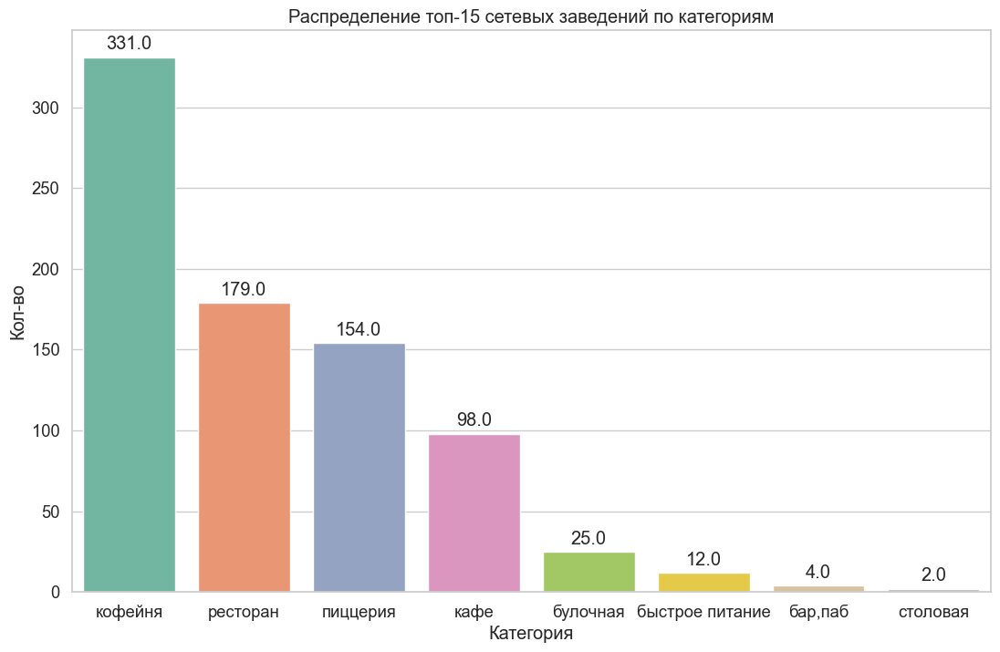

In [56]:
# строим гистограмму распределения медианного кол-ва мест по категориям
category_hist('category', 'name', top_15_by_category, 'Кол-во', 'Категория',
              'Распределение топ-15 сетевых заведений по категориям')

* Для большей наглядности покажем **долю** каждой из категорий в топ-15 сетевых заведений.

In [57]:
top_15_by_category['share'] = round((top_15_by_category['name'] / top_15_slice.shape[0]) * 100, 2)
top_15_by_category

,category,name,share
4,кофейня,331,41.12
6,ресторан,179,22.24
5,пиццерия,154,19.13
3,кафе,98,12.17
1,булочная,25,3.11
2,быстрое питание,12,1.49
0,"бар,паб",4,0.50
7,столовая,2,0.25


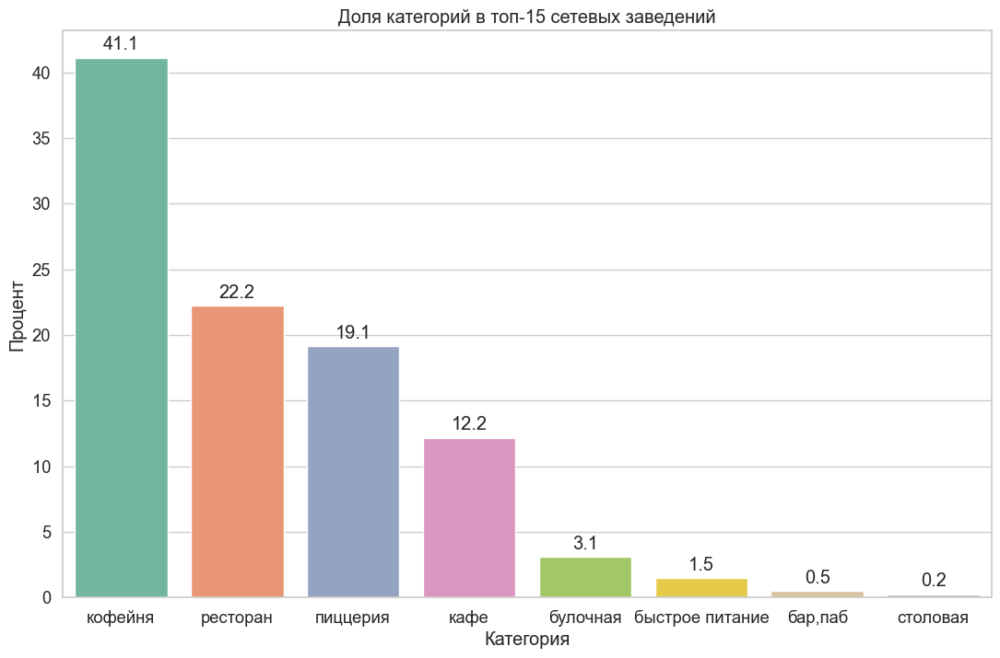

In [58]:
# строим гистограмму распределения долей категорий в топ-15 сетей
category_hist('category', 'share', top_15_by_category, 'Процент', 'Категория',
              'Доля категорий в топ-15 сетевых заведений')

**Вывод:**\
Среди сетевых заведений значительно преобладают **кофейни**. Доля **баров** и **столовых** на уровне статистической погрешности.

### Распределение по административным районам

* Визуализируем **количественное** распределение заведений по административным районам

In [59]:
# рассчитаем кол-во заведений по районам, положим расчет в новую переменную и изменим названия столбцов
district_cnt = places['district'].value_counts().reset_index()
district_cnt.columns = ['district', 'total']

In [60]:
# напишем функцию для построения горизонтальной гистограммы
def display_h_hist(data, yvalue, xlabel, ylabel, title):
    # сортируем данные по возрастанию значений
    data_sorted = data.sort_values('total', ascending=True)

    # выбираем цветовую схему
    color_scale = px.colors.qualitative.Set2

    # строим горизонтальную гистограмму с помощью библиотеки plotly 
    fig = go.Figure()

    fig.add_trace(go.Bar(
        x=data_sorted['total'],
        y=data_sorted[yvalue],
        orientation='h',
        marker_color=color_scale[2],
        text=data_sorted['total'],
        textposition='auto'
    ))

    fig.update_traces(texttemplate='%{text}', textfont_size=12)

    fig.update_layout(
        title=title,
        xaxis_title=xlabel,
        yaxis_title=ylabel,
        height=700,
        width=980
    )

    fig.show()

In [61]:
# построим гистограмму распределения кол-ва заведений по районам
display_h_hist(district_cnt, 'district', 'Кол-во', 'Район', 'Кол-во заведений по районам')

* Теперь визуализируем **доли категорий** в каждом из районов, сохранив сортировку по кол-ву заведений\
от **максимального** сверху к **минимальному** снизу.

In [62]:
# создаем таблицу с кол-вом по категориям и районам, считаем долю категории в рамках района
category_district_cnt = places.groupby(['category', 'district']).size().reset_index(name='district_qty')
category_district_shares = pd.merge(category_district_cnt, district_cnt, on='district')
category_district_shares['share'] = category_district_shares['district_qty'] / category_district_shares['total']


# сортируем по общему кол-ву заведений в районе
sorted_districts = category_district_shares.sort_values(by='total', ascending=True)

In [63]:
# напишем функцию для построения гистограммы с долями категорий
def display_categories_shares(share_data, sorted_data, y_feature, xlabel, ylabel, title):
    fig = go.Figure()
    color_scale = px.colors.qualitative.Set2

    for i, category in enumerate(share_data['category'].unique()):
        data = sorted_data[sorted_data['category'] == category]
        fig.add_trace(go.Bar(
            x=data['share'],
            y=data[y_feature],
            text=data['share'].apply(lambda x: f'{x:.0%}'),
            textposition='auto',
            orientation='h',
            name=category,
            marker=dict(color=color_scale[i])
        ))

    fig.update_layout(
        title=title,
        xaxis=dict(title=xlabel),
        yaxis=dict(title=ylabel),
        barmode='stack',
        height=550,
        width=980,
        legend_title='Категория',
        legend_traceorder='reversed'
    )

    fig.show()

In [64]:
# строим визуацизацию долей категорий по районам
display_categories_shares(category_district_shares, sorted_districts, 'district',
                          'Доля', 'Район', 'Доли категорий по районам')

**Вывод:**\
**Центральный** административный округ более чем **в 2 раза** обходит ближайшего преследователя по кол-ву заведений.\
В **Северо-Западном** административном округе **значительно** меньше объектов, чем во всех остальных. Прочие помимо упомянутых районы находятся примерно на одном уровне.\
Отметим, что **ЦАО** отличается наибольшей долей **баров** и **ресторанов** и наименьшей долей **пиццерий**,\
а самый "бедный" по кол-ву заведений **СЗАО** - большой долей **ресторанов**.
Примечательно также, что **ВАО** и **ЮВАЮ** показывают большую долю **кафе** и при этом самую маленькую долю **кофеен**.

### Средний рейтинг по категориям

* Построим бокс плот, чтобы оценить распределение и статистику.

In [65]:
display_boxplot(places, 'category', 'rating', 'Категория', 'Рейтинг', 'Рейтинг по категориям заведений')

* Видим значительные выбросы во всех категориях, значит визуализацию будем строить по медианным значениям.

In [66]:
# считаем медианные значения рейтингов по категориям
median_ratings = places.groupby('category')['rating'].median().reset_index()

# сортируем по убыванию
median_ratings = median_ratings.sort_values(by='rating', ascending=False)

median_ratings

,category,rating
0,"бар,паб",4.4
1,булочная,4.3
4,кофейня,4.3
5,пиццерия,4.3
6,ресторан,4.3
7,столовая,4.3
2,быстрое питание,4.2
3,кафе,4.2


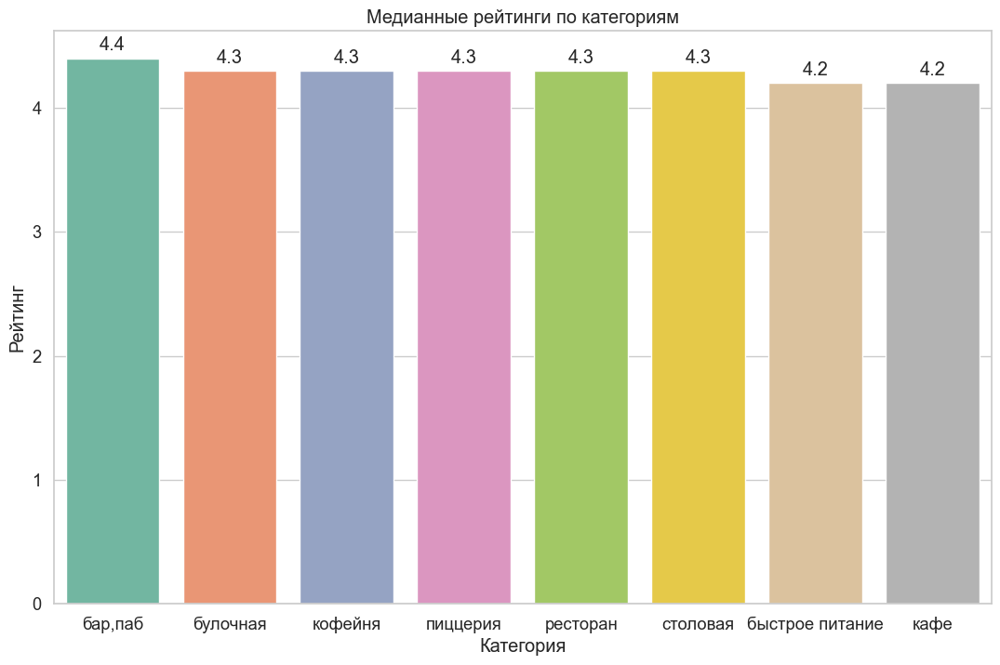

In [67]:
# строим гистограмму распределения медианных рейтингов по категориям
category_hist('category', 'rating', median_ratings, 'Рейтинг', 'Категория',
              'Медианные рейтинги по категориям')

**Вывод:**\
Наиболее высокий медианный рейтинг у **баров**, наименее - у **кафе**. Остальные категории по данному признаку находятся на одном уровне и в в целом разница между категориями незначительна.

### Средний рейтинг по районам

* Чтобы визуализировать распределение значений среднего рейтига по районам, мы будем использовать **фоновую картограмму**.\
Для этого обратимся к файлу с границами административных округов Москвы.

In [68]:
try:
    with open('/datasets/admin_level_geomap.geojson', 'r') as f:
        state_geo = f.read()
except FileNotFoundError:
    with open('admin_level_geomap.geojson', 'r') as f:
        state_geo = f.read()

* Теперь напишем функцию для создания фоновой картограммы.

In [69]:
def display_choropleth(data, feature, legend_nm):
    # moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
    moscow_lat, moscow_lng = 55.751244, 37.618423

    # создаём карту Москвы
    map_name = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

    # создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
    Choropleth(
        geo_data=state_geo,
        data=data,
        columns=['district', feature],
        key_on='feature.name',
        fill_color='YlGn',
        fill_opacity=0.8,
        legend_name=legend_nm,
    ).add_to(map_name)

    return map_name

* Посчитаем медианный рейтинг по районам и визуализируем распределение на карте Москвы.

In [70]:
# посчитаем медианный рейтинг и положим таблицу в новую переменную
rating_by_dist = places.groupby('district', as_index=False)['rating']\
                    .agg('median').sort_values(by='rating', ascending=False)
rating_by_dist

,district,rating
5,Центральный административный округ,4.4
0,Восточный административный округ,4.3
1,Западный административный округ,4.3
2,Северный административный округ,4.3
4,Северо-Западный административный округ,4.3
7,Юго-Западный административный округ,4.3
8,Южный административный округ,4.3
3,Северо-Восточный административный округ,4.2
6,Юго-Восточный административный округ,4.2


In [71]:
# выведем фоновую картограмму
display_choropleth(rating_by_dist, 'rating', 'Рейтинг по районам')

**Вывод:**\
Наивысший рейтинг заведений наблюдается в **ЦАО**, самый низкий - в **СВАО** и **ЮВАО**.

### Отображение заведений на карте

* Отобразим все заведения, имеющиеся в нашем датасете, на карте Москвы с использованием маркеров и кластеров.

In [72]:
# задаем центр Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# задаем переменную с картой
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаем маркеры с использованием кластеров
marker_cluster = MarkerCluster().add_to(m)

# создаем функцию, которая возьмет значения широты и долготы для каждой точки, плюс добавит рейтинг заведения
def create_clusters(row):
    rating = '{:.1f}'.format(row['rating'])
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {rating}",
    ).add_to(marker_cluster)

# применяем функцию к датасету
places.apply(create_clusters, axis=1)

# выводим карту
m

**Вывод:**\
По кластерам видим, что максимальное кол-во заведений сконцентрировано в центральной части города,\
что подтверждает выводы, сделанные нами ранее. Значит визуализация построена корректно.

### Топ-15 улиц

In [73]:
# создадим переменную с топ-15 улиц по кол-ву расположенных на них заведений
top_15_streets = places.groupby('street', as_index=False).agg(total=('name', 'count'))\
            .sort_values(by='total', ascending=False).head(15)
top_15_streets

,street,total
1084,проспект Мира,184
769,Профсоюзная улица,118
522,Ленинский проспект,107
1081,проспект Вернадского,96
370,Дмитровское шоссе,87
452,Каширское шоссе,76
295,Варшавское шоссе,74
520,Ленинградский проспект,72
521,Ленинградское шоссе,70
547,МКАД,65


In [74]:
# построим горизонтальную гистограмму для визуализации кол-ва заведений на улицах, входящих в топ-15
display_h_hist(top_15_streets, 'street', 'Кол-во', 'Улица', 'Топ-15 улиц по кол-ву заведений')

* Теперь визуализируем **доли категорий** на каждой улице из топ-15, сохранив сортировку по общему кол-ву заведений\
от **максимального** сверху к **минимальному** снизу.

In [75]:
# создадим срез по топ-15 улиц
top_15_streets_slice = places[places['street'].isin(top_15_streets['street'])]

In [76]:
# создаем таблицу с кол-вом по категориям и улицам, считаем долю категории в рамках улицы
category_streets_cnt = top_15_streets_slice.groupby(['category', 'street']).size().reset_index(name='street_qty')
category_streets_shares = pd.merge(category_streets_cnt, top_15_streets, on='street')
category_streets_shares['share'] = category_streets_shares['street_qty'] / category_streets_shares['total']

# сортируем по общему кол-ву заведений на улице
sorted_streets = category_streets_shares.sort_values(by='total', ascending=True)

In [77]:
# строим визуацизацию долей категорий по районам
display_categories_shares(category_streets_shares, sorted_streets, 'street',
                          'Доля', 'Улица', 'Доли категорий на улицах из топ-15')

**Вывод:**\
В целом доли распределения категорий на улицах из топ-15 отражают общую тенденцию по датасету,
то есть **наибольшее** кол-во заведений относится к **кафе** и **ресторанам**. При этом отметим довольно низкую долю **кафе** на **Ленинградском** проспекте и на **Пятницкой**,\
а также **доминирующую** их долю на **МКАД**.\
Кроме того, обратим внимание, что доля **кофеен** здесь очень **низкая**, что нехарактерно ни для датасета в целом,\
ни для нашего анализа категорий в разрезе сетевых заведений.

### Улицы с единственным объектом

* Создадим срез по улицам, на которых расположено только одно заведение общественного питания.

In [78]:
# считаем кол-во заведений на каждой улице 
street_cnt = places.groupby('street').size()

# создаем список улиц с 1 заведением
single_place_streets = street_cnt[street_cnt == 1].index

# создаем маску для среза
mask = places['street'].isin(single_place_streets)

# создаем срез и кладем его в новую переменную
single_place_slice = places[mask]

* Покажем долю единственных на улице заведений от общего кол-ва по району на фоновой картограмме.

In [79]:
# посчитаем долю заведений и положим таблицу в новую переменную
single_place_share = single_place_slice.groupby('district', as_index=False).agg(single_cnt = ('name', 'count'))
single_place_share = pd.merge(single_place_share, district_cnt, on='district')
single_place_share['share'] = round(single_place_share['single_cnt'] / single_place_share['total'], 4) * 100
single_place_share = single_place_share.sort_values(by='share', ascending=False)
single_place_share

,district,single_cnt,total,share
0,Восточный административный округ,50,770,6.49
5,Центральный административный округ,144,2237,6.44
3,Северо-Восточный административный округ,56,881,6.36
2,Северный административный округ,52,869,5.98
6,Юго-Восточный административный округ,39,693,5.63
4,Северо-Западный административный округ,20,398,5.03
8,Южный административный округ,42,864,4.86
1,Западный административный округ,35,830,4.22
7,Юго-Западный административный округ,18,702,2.56


In [80]:
# строим фоновую картограмму
display_choropleth(single_place_share, 'share', 'Доля единственных на улице заведений')

* Выведем и сравним доли категорий в общем датасете и в срезе по улицам с единственным заведением.

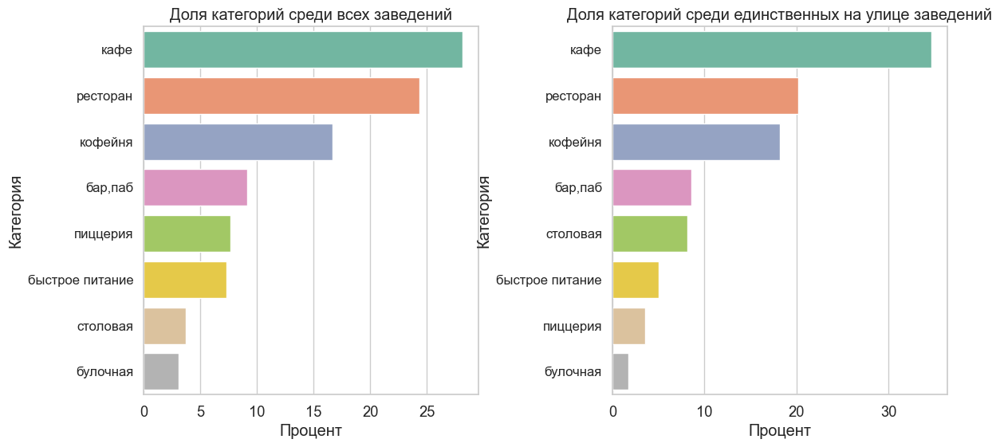

In [81]:
# создаем фигуру с двумя суб-графиками
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(13, 6))

# считаем долю категорий по всему датасету
category_percent = (places['category'].value_counts() / places.shape[0]) * 100

# строим горизонтальную гистограмму по всему датасету
sns.barplot(x=category_percent, y=category_percent.index, orient='h', palette='Set2', ax=axes[0])
axes[0].set_xlabel('Процент')
axes[0].set_ylabel('Категория')
axes[0].set_title('Доля категорий среди всех заведений')
axes[0].tick_params(axis='y', which='major', labelsize=12)

# считаем долю категорий по срезу
category_percent_single = (single_place_slice['category'].value_counts() / single_place_slice.shape[0]) * 100

# строим горизонтальную гистограмму по срезу
sns.barplot(x=category_percent_single, y=category_percent_single.index, orient='h', palette='Set2', ax=axes[1])
axes[1].set_xlabel('Процент')
axes[1].set_ylabel('Категория')
axes[1].set_title('Доля категорий среди единственных на улице заведений')
axes[1].tick_params(axis='y', which='major', labelsize=12)

plt.subplots_adjust(wspace=0.4)

plt.show()

**Вывод:**\
Помимо **ЦАО** наибольшая доля единственных на улице заведений характерна для **ВАО**, **СВАО** и **САО**, а наименьшая - для **ЮЗАО**.\
К особенностям распределения **долей категорий** среди таких заведений относятся заметно меньшая доля **ресторанов** и **пиццерий**,\
а также бОльшая доля **кафе**, **столовых** и **кофеен** по сравнению с общим датасетом.

### Средний чек по районам

In [82]:
# посчитаем медианные значения среднего чека по районам и выведем таблицу
bill_by_dist = places.groupby('district', as_index=False)['middle_avg_bill']\
                                .agg('median').sort_values(by='middle_avg_bill', ascending=False)
bill_by_dist

,district,middle_avg_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,575.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


In [83]:
# отобразим медианные значения среднего чека по районам на фоновой картограмме
display_choropleth(bill_by_dist, 'middle_avg_bill', 'Средний чек по районам')

**Вывод:**\
Наиболее высокий средний чек встречается в заведениях **ЦАО** и **ЗАО**, а самый низкий характерен для **СВАО**, **ЮАО** и **ЮВАО**.

**Выводы по разделу "Анализ данных":**
1. Наиболее распространенными категориями заведений являются **кафе** и **рестораны**. Наименее распространенными - **столовые** и **булочные**. **Кофейни** несмотря на отставание от кафе и ресторанов **заметно опережают** все остальные категории.
2. Наибольшее кол-во посадочных мест встречается в **ресторанах** и **барах**. **Кофейни** и **столовые** отличаются от лидеров незначительно. **Наименьшее** кол-во мест характерно для **пиццерий** и **булочных**.
3. __Несетевых__ заведений **в 1,5 раза** больше, чем сетевых.
4. Преобладание **сетевых** заведений над **несетевыми** в наибольшей степени характерно для **булочных**. Распределение **пиццерий** и **кофеен** по данному признаку - примерно **50/50**. Среди **баров и пабов** 80% заведений - **несетевые**.
5. Среди топ-15 сетевых зеведений значительно преобладают **кофейни**. Доля **баров** и **столовых** на уровне статистической погрешности.
6. По кол-ву заведений в разрезе районов Москвы **Центральный** административный округ более чем **в 2 раза** обходит ближайшего преследователя. В **Северо-Западном** административном округе - наименьшее кол-во объектов. Все прочие районы примерно на одном уровне по данному параметру.
7. Анализ распределения категорий по районам показал, что **ЦАО** отличается наибольшей долей **баров** и **ресторанов** и наименьшей долей **пиццерий**, а самый "бедный" по кол-ву заведений **СЗАО** - большой долей **ресторанов**. **ВАО** и **ЮВАЮ** показывают наибольшую долю **кафе** и при этом самую малькую долю **кофеен**.
8. Наиболее высокий медианный рейтинг показали **бары**, наименьший - **кафе**. Остальные категории по данному признаку находятся на одном уровне и в в целом разница между категориями незначительна.
9. Наивысший рейтинг заведений наблюдается в **ЦАО**, самый низкий - в **СВАО** и **ЮВАО**.
10. Доли распределения категорий на улицах из топ-15 отражают общую тенденцию по датасету, то есть **наиболшее** кол-во заведений относится к **кафе** и **ресторанам**. При этом мы отметили довольно низкую долю **кафе** на **Ленинградском** проспекте и на **Пятницкой**, а также **доминирующую** их долю на **МКАД**.
11. Доля кофеен на улицах из топ-15 очень **низкая**, что нехарактерно ни для датасета в целом, ни для распределения категорий в разрезе сетевых заведений.
12. По кол-ву единственных на улице заведений лидируют **ЦАО**, **ВАО**, **СВАО** и **САО**. Наименьшее кол-во таких заведений мы увидели в **ЮЗАО**. Особенности распределения **долей категорий** среди таких заведений - это заметно меньшая доля **ресторанов** и **пиццерий**, а также бОльшая доля **кафе**, **столовых** и **кофеен** по сравнению с общим датасетом.
13. Наиболее высокий средний чек встречается в заведениях **ЦАО** и **ЗАО**, а самый низкий характерен для **СВАО**, **ЮАО** и **ЮВАО**.

## Рекомендации по открытию кофейни в Москве

In [84]:
# сделаем срез по кофейням и положим его в новую переменную
coffee_houses = places.query('category == "кофейня"')

In [85]:
# посмотрим общее кол-во кофеен в датасете
print('Общее кол-во кофеен: {}'.format(coffee_houses.shape[0]))

Общее кол-во кофеен: 1373


### Концентрация кофеен по районам Москвы.

In [86]:
# считаем кол-во кофеен в каждом районе
coffee_by_dist = coffee_houses.groupby('district', as_index=False).agg(coffee_cnt=('name', 'count'))\
                                        .sort_values(by='coffee_cnt')
coffee_by_dist

,district,coffee_cnt
4,Северо-Западный административный округ,60
6,Юго-Восточный административный округ,84
7,Юго-Западный административный округ,95
0,Восточный административный округ,101
8,Южный административный округ,124
1,Западный административный округ,145
3,Северо-Восточный административный округ,157
2,Северный административный округ,182
5,Центральный административный округ,425


In [87]:
# визуализируем распределение кофеен по районам с помощью фоновой картограммы
display_choropleth(coffee_by_dist, 'coffee_cnt', 'Кофейни по районам')

In [88]:
print('Районы с наименьшим кол-вом кофеен')
coffee_by_dist.sort_values(by='coffee_cnt').head(4)

Районы с наименьшим кол-вом кофеен


,district,coffee_cnt
4,Северо-Западный административный округ,60
6,Юго-Восточный административный округ,84
7,Юго-Западный административный округ,95
0,Восточный административный округ,101


In [89]:
print('Районы с наибольшим кол-вом кофеен')
coffee_by_dist.sort_values(by='coffee_cnt', ascending=False).head(2)

Районы с наибольшим кол-вом кофеен


,district,coffee_cnt
5,Центральный административный округ,425
2,Северный административный округ,182


* Для принятия решения по району открытия кофейни более показательна **доля кофеен** от общего кол-ва заведений в округе. Посчитаем данную метрику и визуализируем её распределение с помощью фоновой картограммы.

In [90]:
# посчитаем долю кофеен
places_by_dist = places.groupby('district', as_index=False).agg(total_cnt=('name', 'count'))
caffee_share_by_dist = pd.merge(coffee_by_dist, places_by_dist, on='district')
caffee_share_by_dist['share'] = round(caffee_share_by_dist['coffee_cnt'] / places_by_dist['total_cnt'], 2)
caffee_share_by_dist = caffee_share_by_dist.sort_values(by='share')
caffee_share_by_dist

,district,coffee_cnt,total_cnt,share
5,Западный административный округ,145,830,0.06
0,Северо-Западный административный округ,60,398,0.08
1,Юго-Восточный административный округ,84,693,0.10
2,Юго-Западный административный округ,95,702,0.11
3,Восточный административный округ,101,770,0.11
6,Северо-Восточный административный округ,157,881,0.23
7,Северный административный округ,182,869,0.26
4,Южный административный округ,124,864,0.31
8,Центральный административный округ,425,2237,0.49


In [91]:
# отобразим распределение на фоновой картограмме
display_choropleth(caffee_share_by_dist, 'share', 'Доля кофеен от общего кол-ва заведений')

**Вывод:**\
Если исходить из того, что кофейню стоит открывать в районе с **наименьшим** уровнем конкуренциии, то для открытия более других округов подходят:
* __ЗАО__
* __СЗАО__
* __ЮВАО__
* __ЮЗАО__
* __ВАО__

Доля кофеен в **ЦАО** достигает почти 50%, поэтому данный район не рекомендуется для открытия заведения этой категории из-за потенциально высокого уровня конкуренции.

### Круглосуточные кофейни

* Визуализируем долю круглосуточных кофеен.

In [92]:
# создаем переменную с кол-вом круглосуточных кофеен
day_night_coffee_counts = coffee_houses['is_24/7'].value_counts()

# создаем переменные для построения визуализации
day_night_labels = ['Круглосуточные', 'Некруглосуточные']
day_night_values = [day_night_coffee_counts[1], day_night_coffee_counts[0]]

In [93]:
# визуализируем доли сетевых и несетевых заведений
display_pieplot(day_night_labels, day_night_values, 'Доля круглосуточных кофеен')

* Визуализируем распределение круглосуточных кофеен по районам.

In [94]:
# считаем кол-во круглосуточных кофеен в каждом из районов
day_night_coffee_by_districts = coffee_houses.query('`is_24/7` == True')\
                                .groupby('district', as_index=False).agg(cnt=('name', 'count'))\
                                .sort_values(by='cnt')
day_night_coffee_by_districts

,district,cnt
6,Юго-Восточный административный округ,1
3,Северо-Восточный административный округ,2
4,Северо-Западный административный округ,2
0,Восточный административный округ,5
2,Северный административный округ,5
7,Юго-Западный административный округ,7
1,Западный административный округ,9
5,Центральный административный округ,25


In [95]:
# отобразим распределение на фоновой картограмме
display_choropleth(day_night_coffee_by_districts, 'cnt', 'Круглосуточные кофейни по районам')

**Вывод:**\
Для открытия круглосуточной кофейни в **низкоконкурентной** среде можно выбрать любой район кроме **ЦАО**, **ЗАО** и **ЮЗАО**.\
Отметим также, что в **ЮАО** круглосуточных кофеен нет **вообще**, поэтому данный район можно назвать **наиболее** привлекательным для открытия такого заведения. Однако следует иметь ввиду, что малое количество **кофеен 24/7** в районе может говорить и об отсутствии у потребителей интереса к ним.

### Рейтинги кофеен по районам

* Для этой задачи разумно будет считать средний рейтинг, а не медиану, поскольку мы сейчас анализируем меньший набор данных, чем ранее при анализе рейтинга всех категорий заведений.

In [96]:
# посчитаем средний рейтинг кофеен по районам
coffee_rating_by_dist = round(coffee_houses.groupby('district', as_index=False)['rating']\
                              .agg('mean'), 2).sort_values(by='rating', ascending=False)
coffee_rating_by_dist

,district,rating
5,Центральный административный округ,4.33
4,Северо-Западный административный округ,4.31
2,Северный административный округ,4.29
7,Юго-Западный административный округ,4.29
0,Восточный административный округ,4.28
8,Южный административный округ,4.24
3,Северо-Восточный административный округ,4.22
6,Юго-Восточный административный округ,4.22
1,Западный административный округ,4.19


In [97]:
# отобразим распределение на фоновой картограмме
display_choropleth(coffee_rating_by_dist, 'rating', 'Средний рейтинг кофеен')

* Самые низкие рейтинги у кофеен в **ЗАО**, а самые высокие - в **ЦАО** и **СЗАО**.
Низкие рейтинги существующих заведений могут свидетельствовать о **сниженной удовлетворенности** посетителей, что потенциально будет стимулировать их **интерес** к новой кофейне. Однако низкий рейтинг может свидетельствовать и о **требовательности** потенциальных клиентов, и о **низком интересе** к кофейням в целом.

* Для принятия решения по выбору района открытия кофейни исходя из рейтинга более показательным будет соотношение медианного рейтинга кофеен с медианным рейтингом всех заведений района в целом.

In [98]:
# посчитаем соотношение рейтинга кофеен и общего рейтинга заведений в каждом районе
coffee_med_ratings_by_dist = coffee_houses.groupby('district', as_index=False).agg(coffee_rating=('rating', 'median'))
coffee_rating_index = pd.merge(rating_by_dist, coffee_med_ratings_by_dist, on='district')
coffee_rating_index['index'] = round(coffee_rating_index['coffee_rating'] / coffee_rating_index['rating'], 2)
coffee_rating_index

,district,rating,coffee_rating,index
0,Центральный административный округ,4.4,4.3,0.98
1,Восточный административный округ,4.3,4.3,1.00
2,Западный административный округ,4.3,4.2,0.98
3,Северный административный округ,4.3,4.3,1.00
4,Северо-Западный административный округ,4.3,4.3,1.00
5,Юго-Западный административный округ,4.3,4.3,1.00
6,Южный административный округ,4.3,4.3,1.00
7,Северо-Восточный административный округ,4.2,4.3,1.02
8,Юго-Восточный административный округ,4.2,4.3,1.02


In [99]:
# отобразим распределение на фоновой картограмме
display_choropleth(coffee_rating_index, 'index', 'Рейтинг кофеен к общему')

In [100]:
# посчитаем соотношение рейтинга кофеен и общего рейтинга заведений в каждом районе
coffee_med_ratings_by_dist = coffee_houses.groupby('district', as_index=False).agg(coffee_rating=('rating', 'median'))
ratings_coffee_excluded = places.query('category != "кофейня"').groupby('district', as_index=False).agg(others_rating=('rating', 'median'))
coffee_rating_index = pd.merge(ratings_coffee_excluded, coffee_med_ratings_by_dist, on='district')
coffee_rating_index['index'] = round(coffee_rating_index['coffee_rating'] / coffee_rating_index['others_rating'], 2)
coffee_rating_index

,district,others_rating,coffee_rating,index
0,Восточный административный округ,4.3,4.3,1.00
1,Западный административный округ,4.3,4.2,0.98
2,Северный административный округ,4.3,4.3,1.00
3,Северо-Восточный административный округ,4.2,4.3,1.02
4,Северо-Западный административный округ,4.3,4.3,1.00
5,Центральный административный округ,4.4,4.3,0.98
6,Юго-Восточный административный округ,4.2,4.3,1.02
7,Юго-Западный административный округ,4.3,4.3,1.00
8,Южный административный округ,4.3,4.3,1.00


In [101]:
# отобразим распределение на фоновой картограмме
display_choropleth(coffee_rating_index, 'index', 'Рейтинг кофеен к общему')

**Вывод:**\
Визуализация распределения показателя отношения рейтинга кофеен к общему рейтингу дает нам иную картину привлекательности районов для открытыя кофейни:
* __СВАО__ и **ЮВАО** - на картограмме средних рейтингов данные районы представлялись привлекательными для открытия кофейни,\
однако визуализация соотношения показывает, что, несмотря на низкие средние рейтинги кофеен, они выше, чем рейтинги заведений в целом, а это говорит о высоком уровне конкурентной среды в данных округах.
* __ЦАО__ показывал высокий уровень среднего рейтинга, однако индекс соотношения здесь низкий, за счет чего ЦАО может считаться привлекательным районом для открытия кофейни с точки зрения рейтинга.
* __ЗАО__ имеет как низкий уровень среднего рейтинга, так и низкий уровень индекса соотношения.

**Рекомендации:**\
Исходя из анализа ретинга заведений для открытия кофейни рекомендуются **ЦАО** и **ЗАО**, поскольку низкий индекс отношения рейтинга кофеен к общему рейтингу заведений по району создает хорошие предпосылки для привлечения клиентов.\
Не рекомендуются: **СВАО** и **ЮВАО**

* создает хорошие предпосылки для привлечения клиентов

### Стоимость чашки капучино

In [102]:
# Посчитаем медианную стоимость чашки капучино для каждого района
cappuccino_price = coffee_houses.groupby('district', as_index=False)['middle_coffee_cup']\
                                        .agg('median').sort_values(by='middle_coffee_cup')
cappuccino_price

,district,middle_coffee_cup
0,Восточный административный округ,135.0
8,Южный административный округ,149.0
6,Юго-Восточный административный округ,150.0
4,Северо-Западный административный округ,157.0
2,Северный административный округ,159.5
3,Северо-Восточный административный округ,162.5
1,Западный административный округ,187.0
5,Центральный административный округ,190.0
7,Юго-Западный административный округ,199.0


In [103]:
# отобразим распределение на фоновой картограмме
display_choropleth(cappuccino_price, 'middle_coffee_cup', 'Стоимость чашки кофе')

### Рекомендации

По результатам проведенного исследования мы можем дать следующие **рекомендации** по открытию **кофейни**:
1. **Район:** ЗАО\
__Комментарий:__ В данном округе **наименьшая** доля кофеен от общего кол-ва заведений. Общее кол-во кофеен по сравнению с другими районами оценивается как **среднее**. Также ЗАО имеет как **низкий** уровень **среднего рейтинга**, так и низкий уровень **индекса** отношения рейтинга кофеен к общему рейтингу заведений по району, что указывает на более **низкую удовлетворенность** посетителей кофейнями по сравнению с остальными заведениями, расположенными в округе. Это может послужить возникновению конкурентного **преимущества** у новой кофейни.
2. **Режим работы**: круглосуточно\
__Комментарий:__ Кол-во круглосуточных кофеен в ЗАО **больше**, чем в большинстве других районов, однако значительно меньше, чем в **ЦАО**, поэтому оценивается нами как **умеренное**. С одной стороны это говорит о повышенном уровне потенциальной конкуренции для новой кофейни, с другой - это **снижает риски** того, что круглосуточное заведение окажется **невостребованным**.
3. **Локация:** улица с единственным заведением при условии, что это заведение - не кофейня (список и карта ниже)
4. **Стоимость чашки капучино:** 187.00 руб\
__Комментарий:__ Медианная стоимость по ЗАО

In [104]:
# выводим список рекомендуемых улиц
streets_recommended = single_place_slice.loc[(single_place_slice['category'] != 'кофейня')\
                    & (single_place_slice['district'] == 'Западный административный округ'), 'street']

for i in streets_recommended:
    print(i)

Оршанская улица
Крылатский мост
Молдавская улица
Полоцкая улица
улица Неверовского
Промышленный проезд
Тучковская улица
Островная улица
улица Олеко Дундича
улица Пивченкова
Звенигородская улица
Ворошиловский парк
аллея Молодожёнов
Тарутинская улица
Кутузовский проезд
улица Ивана Франко
Платовская улица
1-й Сетуньский проезд
улица Раевского
улица Клочкова
Инициативная улица
улица Говорова
Ботанический сад Московского государственного университета
улица Генерала Дорохова
Барвихинская улица
улица МЖД Киевское 5-й км
Дорогобужская улица
улица Ватутина
2-й переулок Петра Алексеева
улица Кутузова
Воробьёвская набережная
Московская улица
Боровское шоссе


In [105]:
# сделаем срез для визуализации
streets_recommended_map = single_place_slice.query('street.isin(@streets_recommended)')

In [106]:
# визуализируем рекомендуемые улица с помощью картограммы
moscow_lat, moscow_lng = 55.751244, 37.618423

# задаем переменную с картой
zao = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# размещаем маркеры
def create_marker(row):
    rating = '{:.1f}'.format(row['rating'])
    Marker([row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}"
    ).add_to(zao)

# применяем функцию к датасету
streets_recommended_map.apply(create_marker, axis=1)

# выводим карту
zao

## Выводы

**Общие выводы по проекту:**

По результатам проведенного анализа данных установлено:
1. Наиболее распространенными категориями заведений являются **кафе** и **рестораны**. Наименее распространенными - **столовые** и **булочные**. **Кофейни** несмотря на отставание от кафе и ресторанов **заметно опережают** все остальные категории.
2. Наибольшее кол-во посадочных мест встречается в **ресторанах** и **барах**. **Кофейни** и **столовые** отличаются от лидеров незначительно. **Наименьшее** кол-во мест характерно для **пиццерий** и **булочных**.
3. __Несетевых__ заведений **в 1,5 раза** больше, чем сетевых.
4. Преобладание **сетевых** заведений над **несетевыми** в наибольшей степени характерно для **булочных**. Распределение **пиццерий** и **кофеен** по данному признаку - примерно **50/50**. Среди **баров и пабов** 80% заведений - **несетевые**.
5. Среди топ-15 сетевых зеведений значительно преобладают **кофейни**. Доля **баров** и **столовых** на уровне статистической погрешности.
6. По кол-ву заведений в разрезе районов Москвы **Центральный** административный округ более чем **в 2 раза** обходит ближайшего преследователя. В **Северо-Западном** административном округе - наименьшее кол-во объектов. Все прочие районы примерно на одном уровне по данному параметру.
7. Анализ распределения категорий по районам показал, что **ЦАО** отличается наибольшей долей **баров** и **ресторанов** и наименьшей долей **пиццерий**, а самый "бедный" по кол-ву заведений **СЗАО** - большой долей **ресторанов**. **ВАО** и **ЮВАЮ** показывают наибольшую долю **кафе** и при этом самую малькую долю **кофеен**.
8. Наиболее высокий медианный рейтинг показали **бары**, наименьший - **кафе**. Остальные категории по данному признаку находятся на одном уровне и в в целом разница между категориями незначительна.
9. Наивысший рейтинг заведений наблюдается в **ЦАО**, самый низкий - в **СВАО** и **ЮВАО**.
10. Доли распределения категорий на улицах из топ-15 отражают общую тенденцию по датасету, то есть **наиболшее** кол-во заведений относится к **кафе** и **ресторанам**. При этом мы отметили довольно низкую долю **кафе** на **Ленинградском** проспекте и на **Пятницкой**, а также **доминирующую** их долю на **МКАД**.
11. Доля кофеен на улицах из топ-15 очень **низкая**, что нехарактерно ни для датасета в целом, ни для распределения категорий в разрезе сетевых заведений.
12. По кол-ву единственных на улице заведений лидируют **ЦАО**, **ВАО**, **СВАО** и **САО**. Наименьшее кол-во таких заведений мы увидели в **ЮЗАО**. Особенности распределения **долей категорий** среди таких заведений - это заметно меньшая доля **ресторанов** и **пиццерий**, а также бОльшая доля **кафе**, **столовых** и **кофеен** по сравнению с общим датасетом.
13. Наиболее высокий средний чек встречается в заведениях **ЦАО** и **ЗАО**, а самый низкий характерен для **СВАО**, **ЮАО** и **ЮВАО**.

По результатам исследования были выработаны следующие рекомендации для заказчика по открытию кофейни:
1. **Район:** ЗАО\
__Комментарий:__ В данном округе **наименьшая** доля кофеен от общего кол-ва заведений. Общее кол-во кофеен по сравнению с другими районами оценивается как **среднее**. Также ЗАО имеет как **низкий** уровень **среднего рейтинга**, так и низкий уровень **индекса** отношения рейтинга кофеен к общему рейтингу заведений по району, что указывает на более **низкую удовлетворенность** посетителй кофейнями по сравнению с остальными заведениями, расположенными в округе. Это может послужить возникновению конкуретного **преимущества** у новой кофейни.
2. **Режим работы**: круглосуточно\
__Комментарий:__ Кол-во круглосуточных кофеен в ЗАО **больше**, чем в большинстве других районов, однако значительно меньше, чем в **ЦАО**, поэтому оценивается нами как **умеренное**. С одной стороны это говорит о повышенном уровне потенциальной конкуренции для новой кофейни, с другой - это **снижает риски** того, что круглосуточное заведение окажется **невостребованным**.
3. **Локация:** улица с единственным заведением при условии, что это заведение - не кофейня
4. **Стоимость чашки капучино:** 187.00 руб\
__Комментарий:__ Медианная стоимость по ЗАО